In [191]:
from PIL import Image
from PIL import ImageFilter
import matplotlib.pyplot as plt
from pathlib import Path
import sys

# These imports let you use opencv
import cv2 #opencv itself
import numpy as np # matrix manipulations

#the following are to do with this interactive notebook code
import pylab # this allows you to control figure size 
pylab.rcParams['figure.figsize'] = (10.0, 8.0) # this controls figure size in the notebook

# dir and my plot function
base = Path.cwd() 
data_dir = base / "data"
out_data = base / "out"
# print(data_dir)

def pilshow(image,cmap=None):
      plt.imshow(image,cmap=cmap)
      plt.axis("off")
      plt.show()

In [137]:
#read image
im = Image.open(data_dir / "cat.jpg")
print(im.format,im.size,im.mode)
im.show()

JPEG (1280, 1073) RGB


In [46]:
# create thumbnail: small version of large one
newsize=(128,128)
im_copy = im.copy() # use copy() method, do not assign directly
im_copy.thumbnail(newsize)
im_copy.show()

In [47]:
# write image
outfile = out_data / "cat_thumbnail.jpg"
im_copy.save(outfile)

In [53]:
# copy a subrectangle from an image
box = (100, 100, 700, 700)
region = im.crop(box)
region.show()

In [ ]:
# procssing a subrectangle, and pasting it back
region = region.transpose(Image.ROTATE_180)
im.paste(region,box)
im.show()

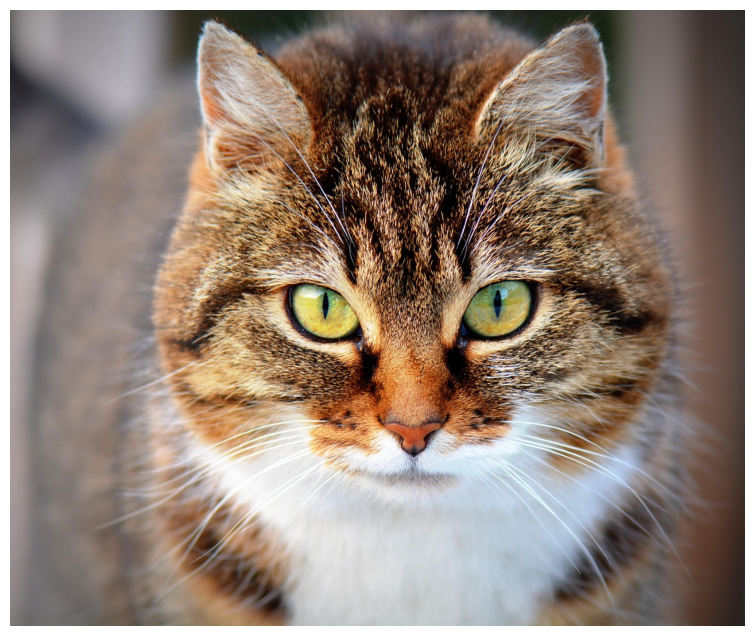

In [193]:
# splitting and merging bands
r, g, b = im.split()
[r.show(), g.show(), b.show()]
rgb = Image.merge("RGB", (r, g, b))
pilshow(rgb)

im


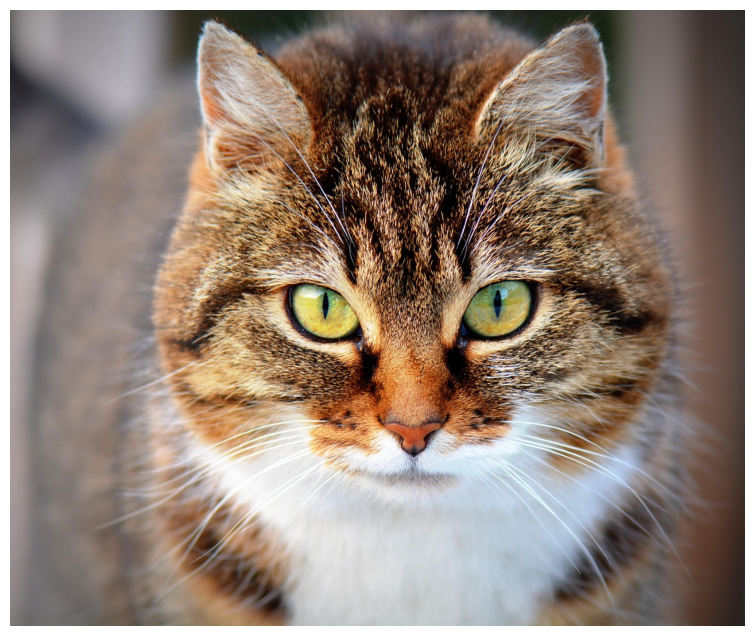

im.filter(ImageFilter.BLUR)


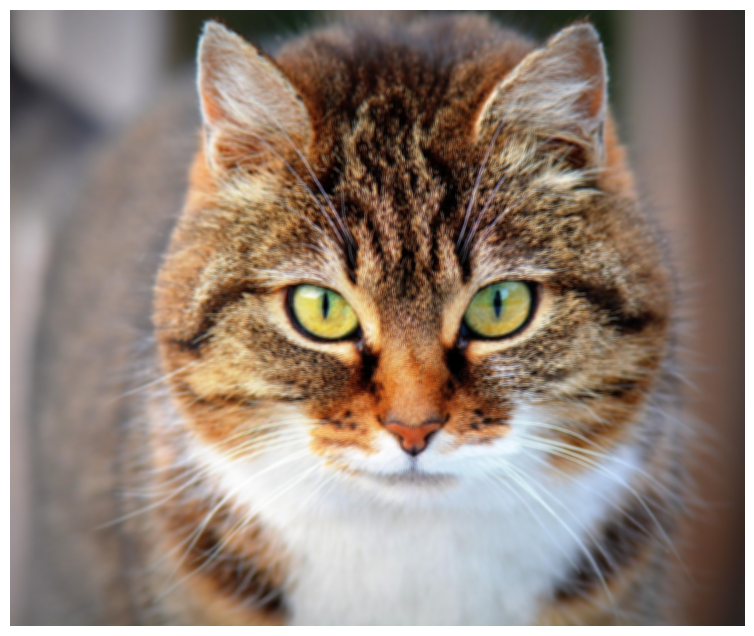

im.filter(ImageFilter.GaussianBlur(radius=20))


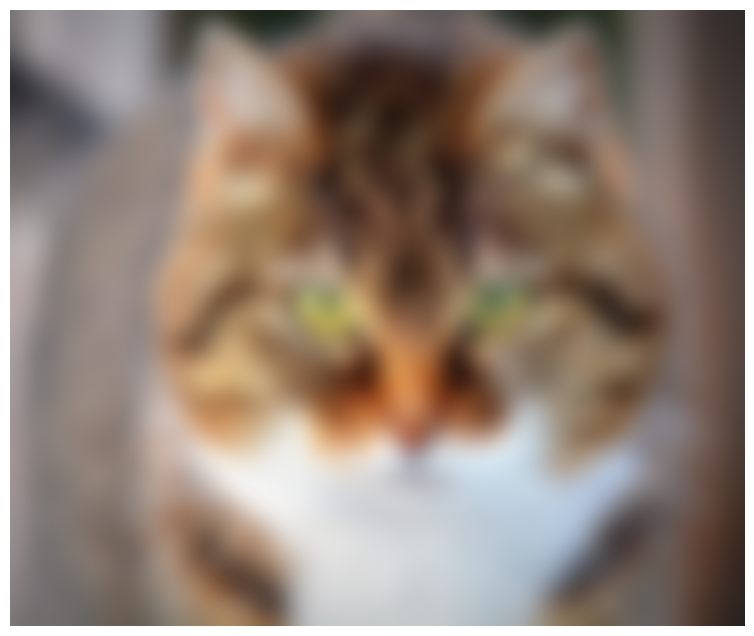

im.filter(ImageFilter.CONTOUR)


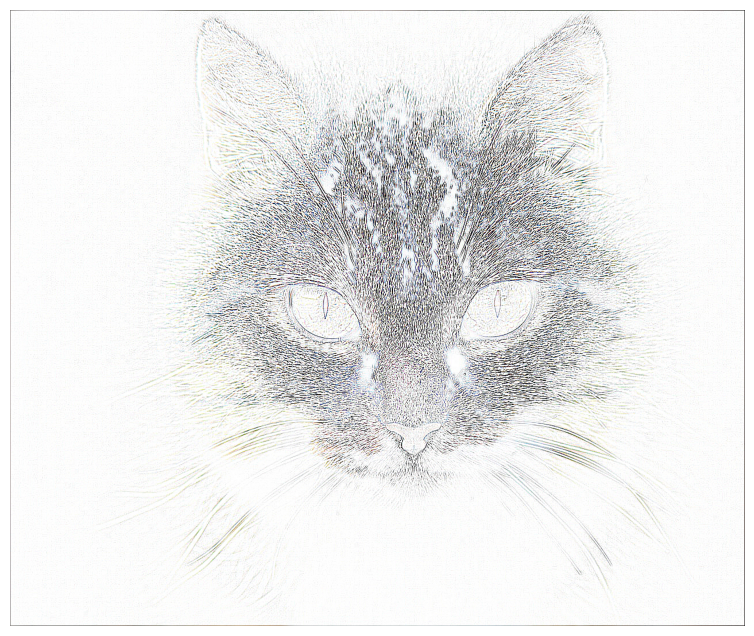

im.filter(ImageFilter.FIND_EDGES)


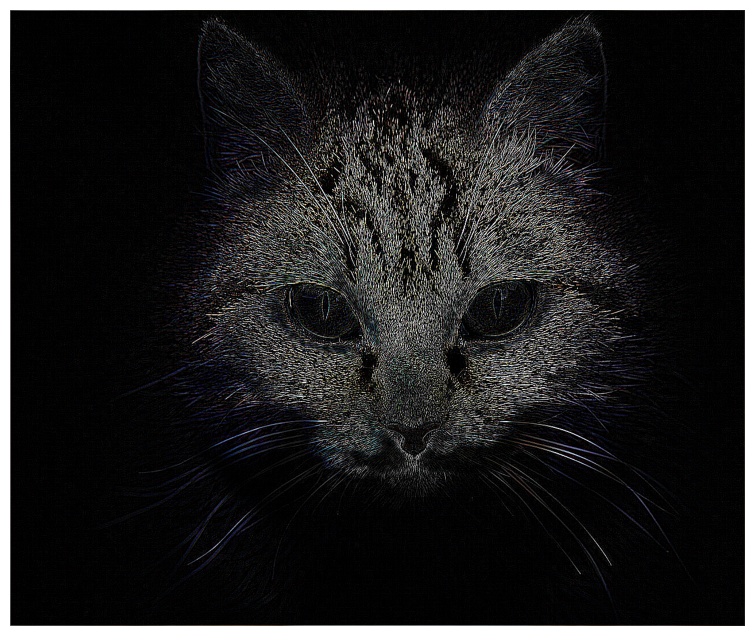

im.filter(ImageFilter.SHARPEN)


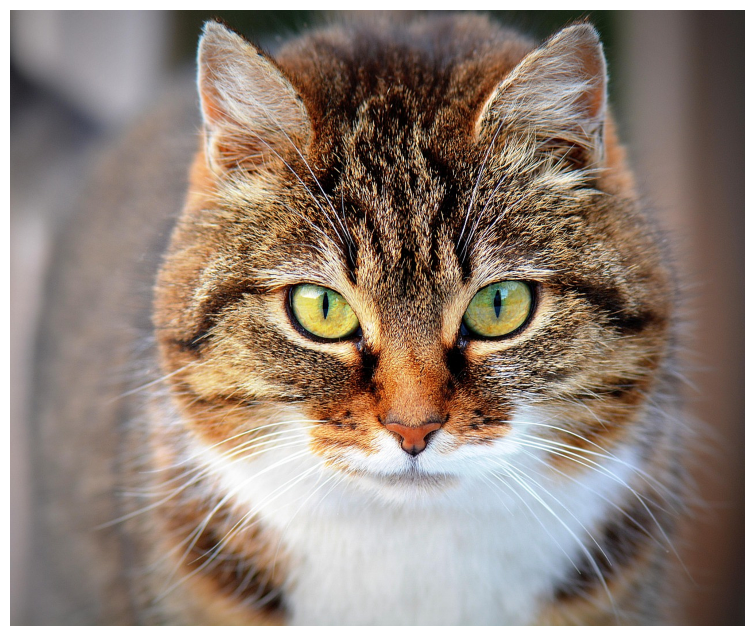

[{None}, {None}, {None}, {None}, {None}, {None}]

In [165]:
# image smoothing / edge
im = Image.open(data_dir / "cat.jpg")
outlist = [None]*6
outlist[0] = "im"
outlist[1] = "im.filter(ImageFilter.BLUR)"
outlist[2] = "im.filter(ImageFilter.GaussianBlur(radius=20))"
outlist[3] = "im.filter(ImageFilter.CONTOUR)"
outlist[4] = "im.filter(ImageFilter.FIND_EDGES)"
outlist[5] = "im.filter(ImageFilter.SHARPEN)"
[{print(image),pilshow(eval(image))} for image in outlist]

im


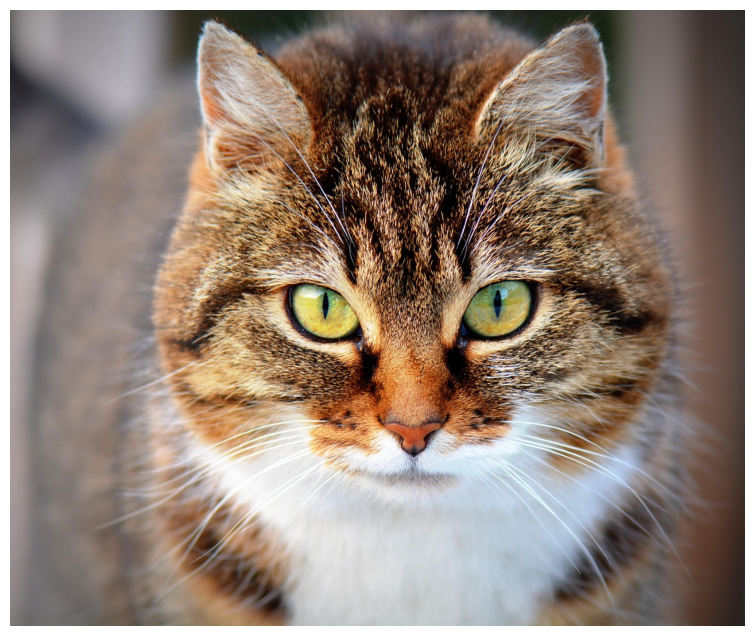

im.resize((128,128))


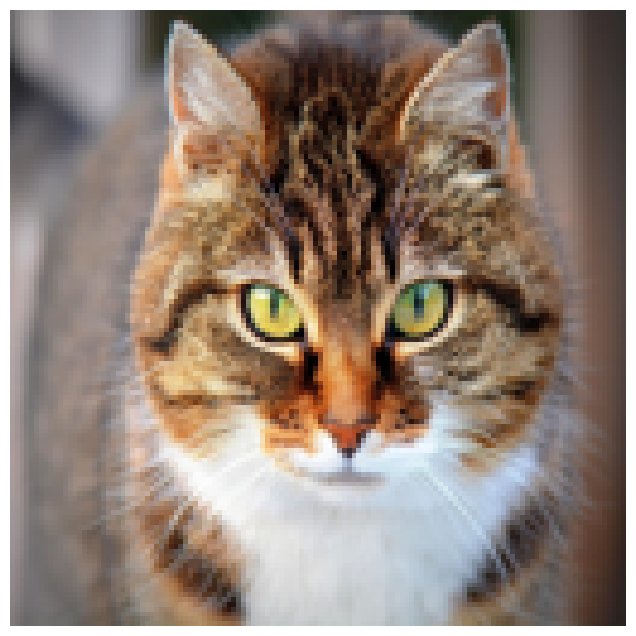

im.rotate(45,expand=True)


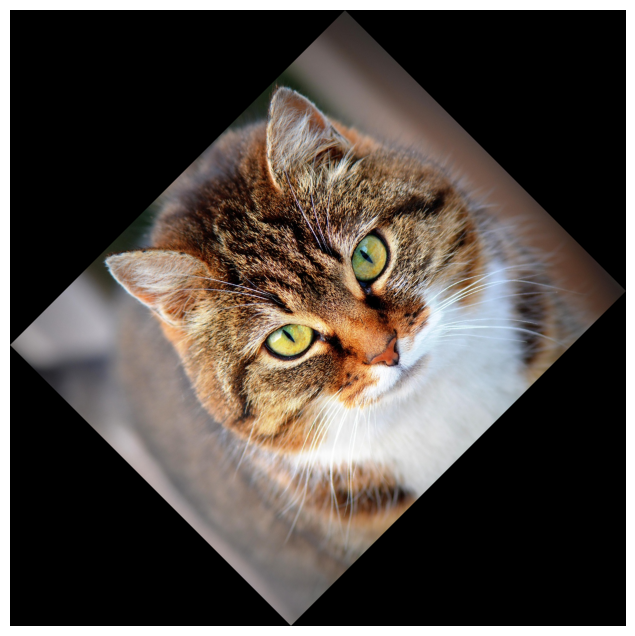

im.transpose(Image.FLIP_LEFT_RIGHT)


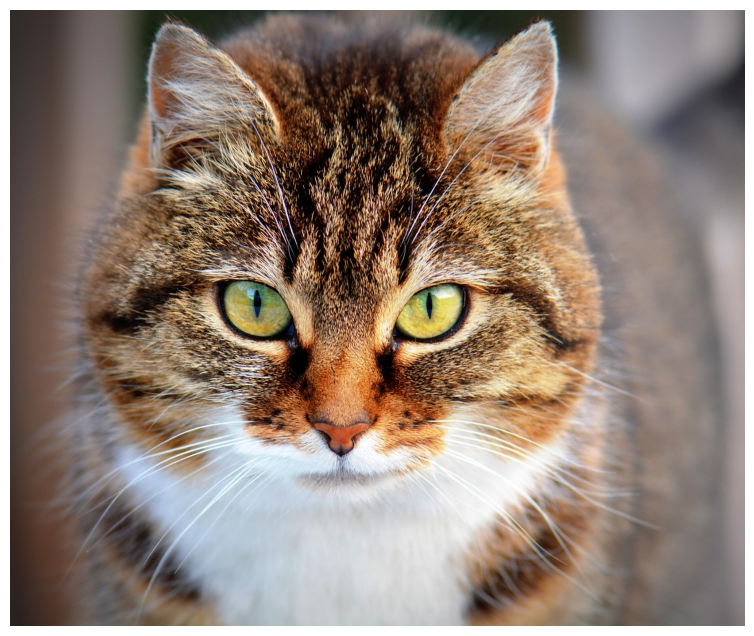

im.transpose(Image.FLIP_TOP_BOTTOM)


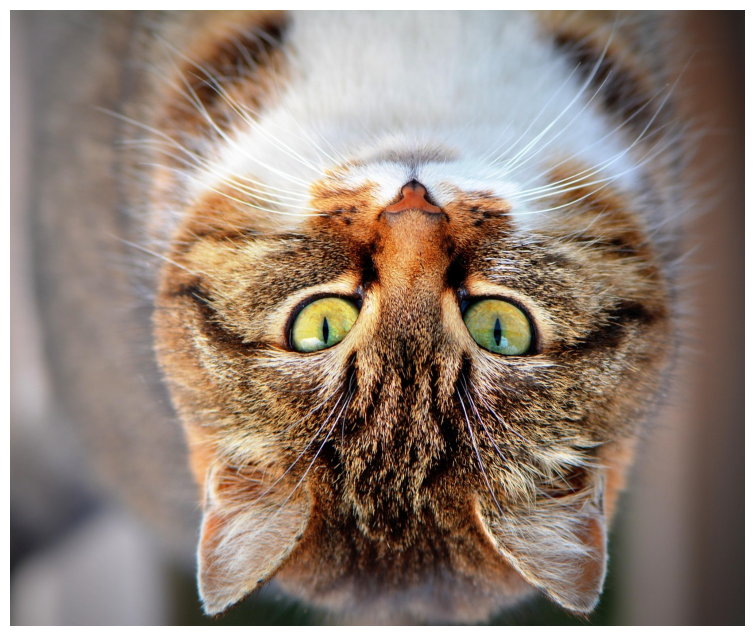

im.convert('L')


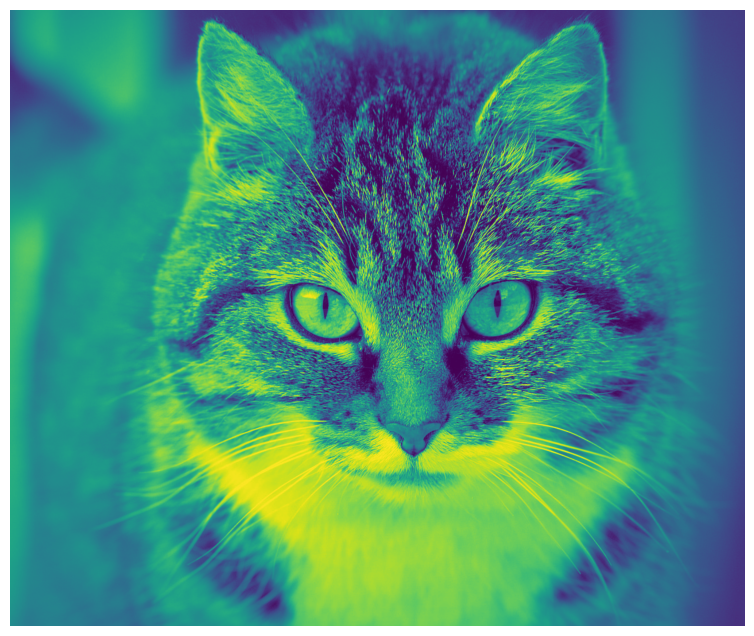

im.convert('P')


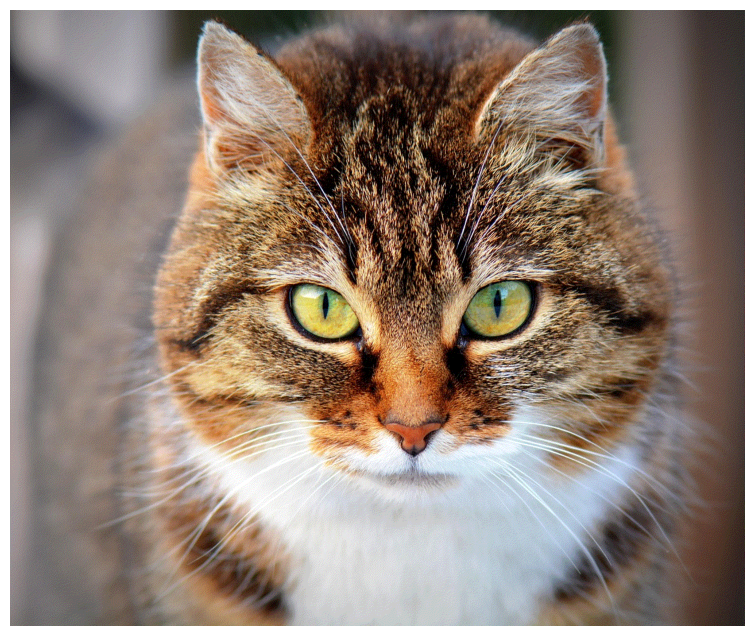

[{None}, {None}, {None}, {None}, {None}, {None}, {None}]

In [194]:
# geometric / color transformation
outlist = [None]*7
outlist[0] = "im"
outlist[1] = "im.resize((128,128))"
# outlist[2] = "im.rotate(45)" # degrees counter-clockwise
outlist[2] = "im.rotate(45,expand=True)"
outlist[3] = "im.transpose(Image.FLIP_LEFT_RIGHT)"
outlist[4] = "im.transpose(Image.FLIP_TOP_BOTTOM)"

# color
outlist[5] = "im.convert('L')"
outlist[6] = "im.convert('P')"
[{print(image),pilshow(eval(image))} for image in outlist]

In [153]:
# Download the test image and utils files
# !pip install wget
!python -m wget \
    https://raw.githubusercontent.com/computationalcore/introduction-to-opencv/master/assets/noidea.jpg \
        -o "{data_dir / 'noidea.jpg'}"



Saved under d:\EE5811\data\noidea (1).jpg


776250 (414, 625, 3) uint8


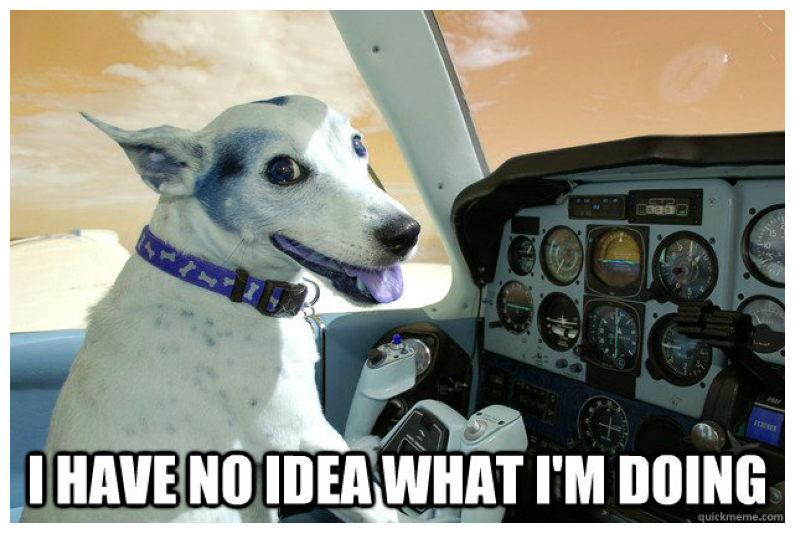

In [195]:
input_image=cv2.imread(data_dir /  'noidea.jpg')
print(input_image.size,input_image.shape,input_image.dtype)
pilshow(input_image)

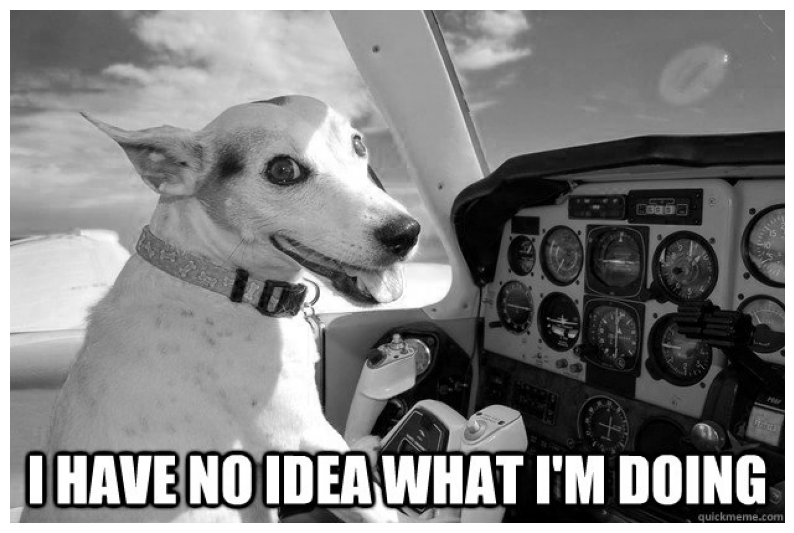

In [196]:
# split channels
b,g,r=cv2.split(input_image)
# show one of the channels (this is red - see that the sky is kind of dark. try changing it to b)
pilshow(r, cmap='gray')

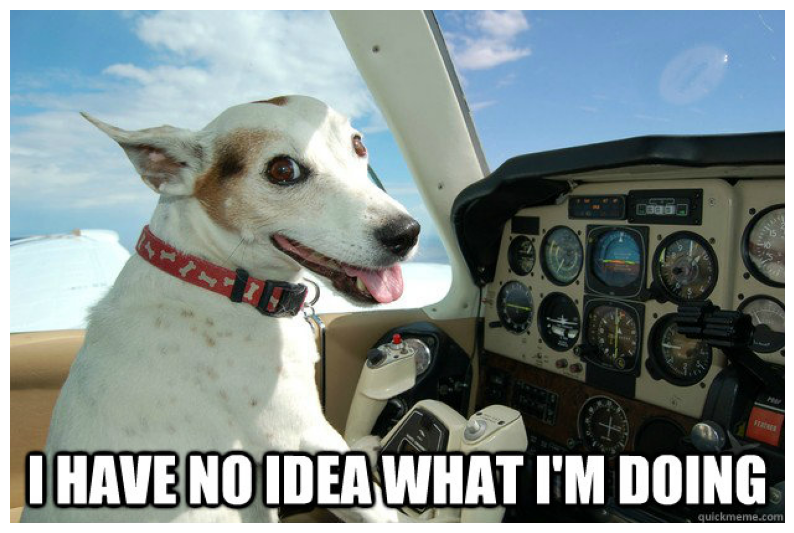

In [197]:
merged=cv2.merge([r,g,b])
# merge takes an array of single channel matrices
pilshow(merged)

In [ ]:
COLORflags = [flag for flag in dir(cv2) if flag.startswith('COLOR') ]
print(COLORflags[:10])
#  [http://docs.opencv.org/trunk/de/d25/imgproc_color_conversions.html] has 
# more information on how these colour conversions are done.

['COLORMAP_AUTUMN', 'COLORMAP_BONE', 'COLORMAP_CIVIDIS', 'COLORMAP_COOL', 'COLORMAP_DEEPGREEN', 'COLORMAP_HOT', 'COLORMAP_HSV', 'COLORMAP_INFERNO', 'COLORMAP_JET', 'COLORMAP_MAGMA']


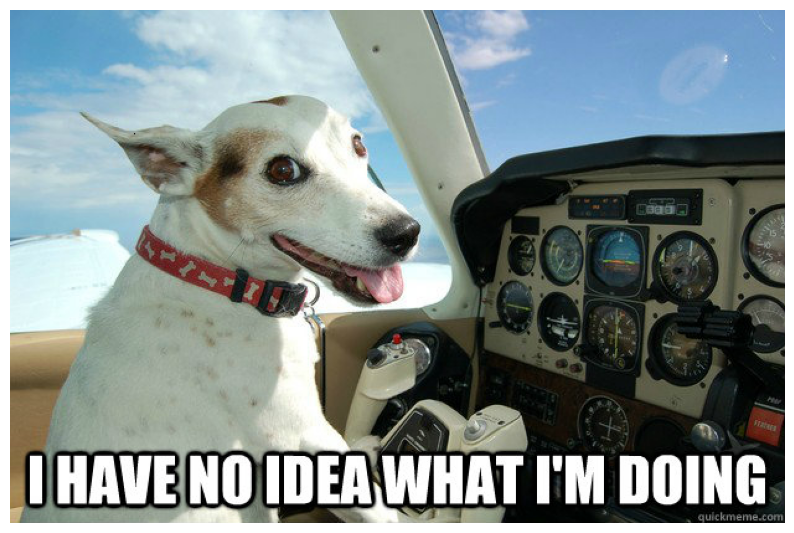

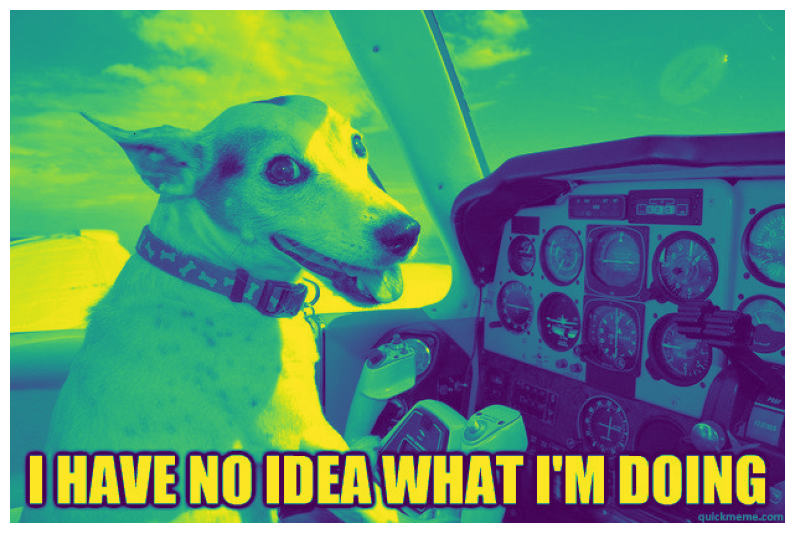

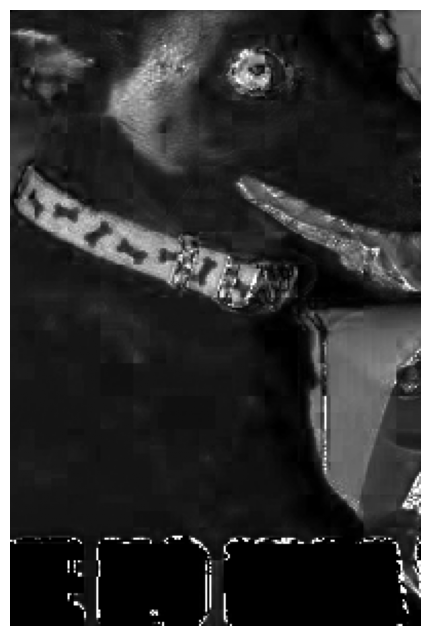

In [205]:

opencv_merged=cv2.cvtColor(input_image, cv2.COLOR_BGR2RGB)
pilshow(opencv_merged)
# If your image is BGR and you want to apply a colormap, you need a single channel (grayscale) first
gray = cv2.cvtColor(input_image, cv2.COLOR_BGR2GRAY)     # to 1-channel
pilshow(gray)

hsvim=cv2.cvtColor(input_image,cv2.COLOR_BGR2HSV)
bcrop =hsvim[100:400, 100:300, 1]
pilshow(bcrop, cmap="gray")


In [ ]:
# Getting image data and setting image data
pixel = input_image[100,100]
print(pixel) # BGR

[150 161 153]


In [200]:
input_image[100,100] = [0,0,0]
pixelnew = input_image[100,100]
print(pixelnew)

[0 0 0]


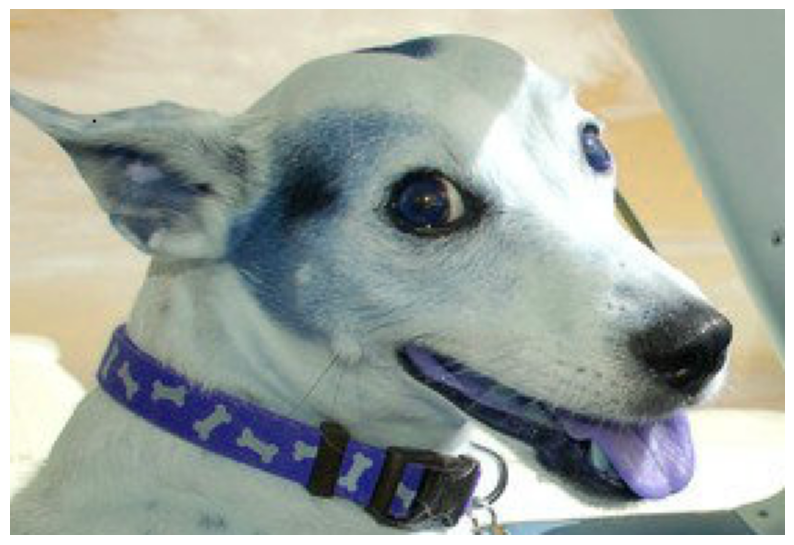

In [201]:
# Getting and setting regions of an image
dogface = input_image[60:250, 70:350]
pilshow(dogface)

190
280


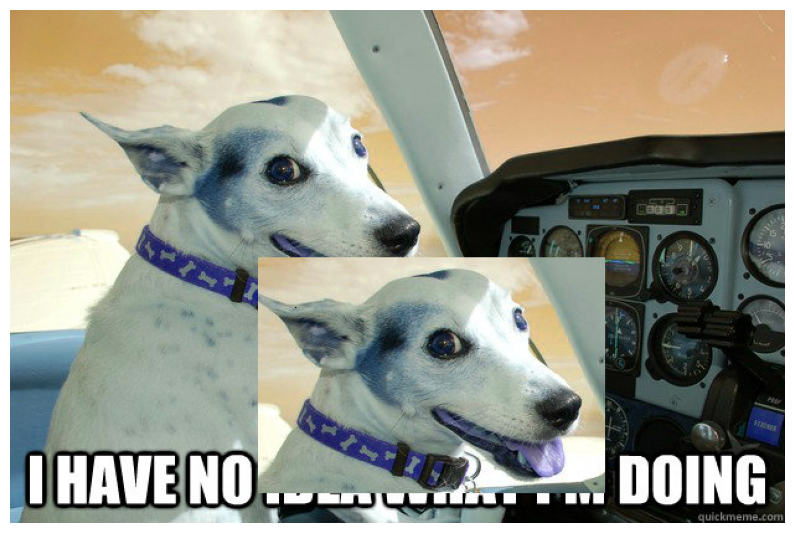

In [203]:
fresh_image=cv2.imread(data_dir / 'noidea.jpg') # it's either start with a fresh read of the image, 
                                  # or end up with dogfaces on dogfaces on dogfaces 
                                   # as you re-run parts of the notebook but not others... 
                            
fresh_image[200:200+dogface.shape[0], 200:200+dogface.shape[1]]=dogface
print(dogface.shape[0])
print(dogface.shape[1])
pilshow(fresh_image)

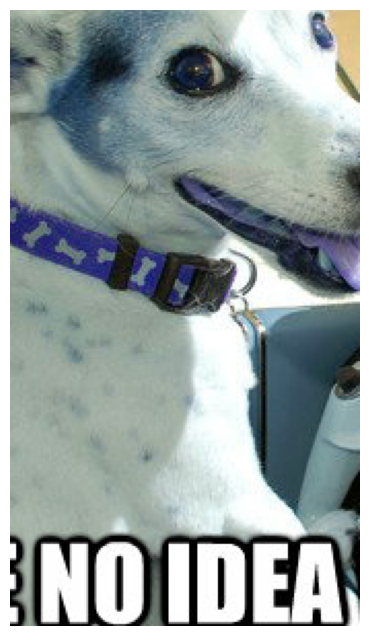

In [204]:
# Matrix slicing
freshim2 = cv2.imread(data_dir / "noidea.jpg")
crop = freshim2[100:400, 130:300] 
pilshow(crop)